In [1]:
import pandas as pd
from pandas_profiling import ProfileReport
import seaborn as sns
import matplotlib.pyplot as plt

import folium
from folium.plugins import HeatMap
import geopandas as gpd
from geopy.geocoders import Nominatim

supermar = pd.read_csv(r'/Users/jaimesastrecrespo/DAFT_1022/module_2/Project_Week_5/supermarket_sales - Sheet1.csv')
supermar.head()

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross margin percentage,gross income,Rating
0,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,1/5/2019,13:08,Ewallet,522.83,4.761905,26.1415,9.1
1,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,3/8/2019,10:29,Cash,76.40,4.761905,3.8200,9.6
2,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,3/3/2019,13:23,Credit card,324.31,4.761905,16.2155,7.4
3,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,1/27/2019,20:33,Ewallet,465.76,4.761905,23.2880,8.4
4,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,2/8/2019,10:37,Ewallet,604.17,4.761905,30.2085,5.3


In [2]:
import numpy as np

In [7]:
supermar.pivot_table( index= 'City', columns='Customer type', values='Total', aggfunc='sum')

Customer type,Member,Normal
City,,
Mandalay,53704.6860,52492.986
Naypyitaw,56881.2825,53687.424
Yangon,53637.4755,52562.895


In [102]:
supermar.shape

(1000, 17)

In [103]:
#finding duplicates rows
supermar.duplicated().sum()

0

In [104]:
profile = ProfileReport(supermar, title='Supermarket sales', explorative = True)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [105]:
supermar.nunique()

Invoice ID                 1000
Branch                        3
City                          3
Customer type                 2
Gender                        2
Product line                  6
Unit price                  943
Quantity                     10
Tax 5%                      990
Total                       990
Date                         89
Time                        506
Payment                       3
cogs                        990
gross margin percentage       1
gross income                990
Rating                       61
dtype: int64

In [106]:
# show null/NA values per column
supermar.isnull().sum()

Invoice ID                 0
Branch                     0
City                       0
Customer type              0
Gender                     0
Product line               0
Unit price                 0
Quantity                   0
Tax 5%                     0
Total                      0
Date                       0
Time                       0
Payment                    0
cogs                       0
gross margin percentage    0
gross income               0
Rating                     0
dtype: int64

In [107]:
corr = supermar.corr()
corr.style.background_gradient (cmap = 'coolwarm')

/Users/jaimesastrecrespo/opt/anaconda3/lib/python3.9/site-packages/pandas/io/formats/style.py:3554: RuntimeWarning:

All-NaN slice encountered

/Users/jaimesastrecrespo/opt/anaconda3/lib/python3.9/site-packages/pandas/io/formats/style.py:3555: RuntimeWarning:

All-NaN slice encountered



,Unit price,Quantity,Tax 5%,Total,cogs,gross margin percentage,gross income,Rating
Unit price,1.000000,0.010778,0.633962,0.633962,0.633962,nan,0.633962,-0.008778
Quantity,0.010778,1.000000,0.705510,0.705510,0.705510,nan,0.705510,-0.015815
Tax 5%,0.633962,0.705510,1.000000,1.000000,1.000000,nan,1.000000,-0.036442
Total,0.633962,0.705510,1.000000,1.000000,1.000000,nan,1.000000,-0.036442
cogs,0.633962,0.705510,1.000000,1.000000,1.000000,nan,1.000000,-0.036442
gross margin percentage,nan,nan,nan,nan,nan,nan,nan,nan
gross income,0.633962,0.705510,1.000000,1.000000,1.000000,nan,1.000000,-0.036442
Rating,-0.008778,-0.015815,-0.036442,-0.036442,-0.036442,nan,-0.036442,1.000000


In [108]:
#checking columns tax and gross income if they're the same to drop the column gross income
df = supermar['Tax 5%'] == supermar['gross income']
df.value_counts()

True    1000
dtype: int64

In [109]:
del supermar['gross margin percentage']

In [110]:
supermar.head()

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross income,Rating
0,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,1/5/2019,13:08,Ewallet,522.83,26.1415,9.1
1,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,3/8/2019,10:29,Cash,76.40,3.8200,9.6
2,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,3/3/2019,13:23,Credit card,324.31,16.2155,7.4
3,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,1/27/2019,20:33,Ewallet,465.76,23.2880,8.4
4,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,2/8/2019,10:37,Ewallet,604.17,30.2085,5.3


In [111]:
supermar.shape

(1000, 16)

In [112]:
corr = supermar.corr()
corr.style.background_gradient (cmap = 'coolwarm')

,Unit price,Quantity,Tax 5%,Total,cogs,gross income,Rating
Unit price,1.000000,0.010778,0.633962,0.633962,0.633962,0.633962,-0.008778
Quantity,0.010778,1.000000,0.705510,0.705510,0.705510,0.705510,-0.015815
Tax 5%,0.633962,0.705510,1.000000,1.000000,1.000000,1.000000,-0.036442
Total,0.633962,0.705510,1.000000,1.000000,1.000000,1.000000,-0.036442
cogs,0.633962,0.705510,1.000000,1.000000,1.000000,1.000000,-0.036442
gross income,0.633962,0.705510,1.000000,1.000000,1.000000,1.000000,-0.036442
Rating,-0.008778,-0.015815,-0.036442,-0.036442,-0.036442,-0.036442,1.000000


In [113]:
# Creating two new columns from day name and month to see the trends during the week adn to know the months where the sales happened.
supermar['Month_day'] = supermar['Date']
supermar['Date'] = \
supermar['day_name'] = pd.to_datetime(supermar['Date']).dt.day_name()
del supermar['Date']


In [114]:
supermar['Time'] = pd.to_datetime(supermar['Time'])
supermar['Hour'] = (supermar['Time']).dt.hour
supermar['Hour'].unique()

array([13, 10, 20, 18, 14, 11, 17, 16, 19, 15, 12])

In [115]:
supermar.columns

Index(['Invoice ID', 'Branch', 'City', 'Customer type', 'Gender',
       'Product line', 'Unit price', 'Quantity', 'Tax 5%', 'Total', 'Time',
       'Payment', 'cogs', 'gross income', 'Rating', 'Month_day', 'day_name',
       'Hour'],
      dtype='object')

In [116]:
supermar.rename(columns={'Invoice ID':'invoice_id'}, inplace=True)
supermar.rename(columns={'Branch':'branch'}, inplace=True)
supermar.rename(columns={'City':'city'}, inplace=True)
supermar.rename(columns={'Customer type':'customer_type'}, inplace=True)
supermar.rename(columns={'Gender':'gender'}, inplace=True)
supermar.rename(columns={'Product line':'product_line'}, inplace=True)
supermar.rename(columns={'Unit price':'unit_price'}, inplace=True)
supermar.rename(columns={'Quantity':'quantity'}, inplace=True)
supermar.rename(columns={'Tax 5%':'tax5'}, inplace=True)
supermar.rename(columns={'Total':'total'}, inplace=True)
supermar.rename(columns={'Time':'time'}, inplace=True)
supermar.rename(columns={'Payment':'payment'}, inplace=True)
supermar.rename(columns={'gross income':'gross_income'}, inplace=True)

In [117]:
supermar['month'] = pd.to_datetime(supermar['Month_day']).dt.month_name()

In [118]:
supermar.head()

,invoice_id,branch,city,customer_type,gender,product_line,unit_price,quantity,tax5,total,time,payment,cogs,gross_income,Rating,Month_day,day_name,Hour,month
0,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,2022-11-13 13:08:00,Ewallet,522.83,26.1415,9.1,1/5/2019,Saturday,13,January
1,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,2022-11-13 10:29:00,Cash,76.40,3.8200,9.6,3/8/2019,Friday,10,March
2,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,2022-11-13 13:23:00,Credit card,324.31,16.2155,7.4,3/3/2019,Sunday,13,March
3,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,2022-11-13 20:33:00,Ewallet,465.76,23.2880,8.4,1/27/2019,Sunday,20,January
4,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,2022-11-13 10:37:00,Ewallet,604.17,30.2085,5.3,2/8/2019,Friday,10,February


/Users/jaimesastrecrespo/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



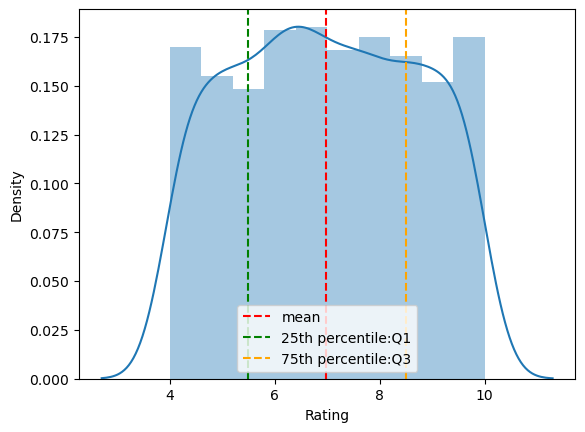

In [119]:
### Fig 1: Distribution of Rating 
###  What does the customer rating look like and is it skewed?

sns.distplot(supermar['Rating'])
plt.axvline(x=np.mean(supermar['Rating']), c='red', ls='--', label='mean')
plt.axvline(x=np.percentile(supermar['Rating'],25),c='green', ls='--', label = '25th percentile:Q1')
plt.axvline(x=np.percentile(supermar['Rating'],75),c='orange', ls='--',label = '75th percentile:Q3' )
plt.legend()

The rating distribution looks uniform and there seems to be no skewness on the left or right side of the distribution. We can plot the mean and the percentiles to show this as well. The red dotted lime is the mean and the green and orange lines indicate the 25th and 75th percentiles respectively.The mean rating is ~7 across products.

/Users/jaimesastrecrespo/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



Yangon       340
Mandalay     332
Naypyitaw    328
Name: city, dtype: int64

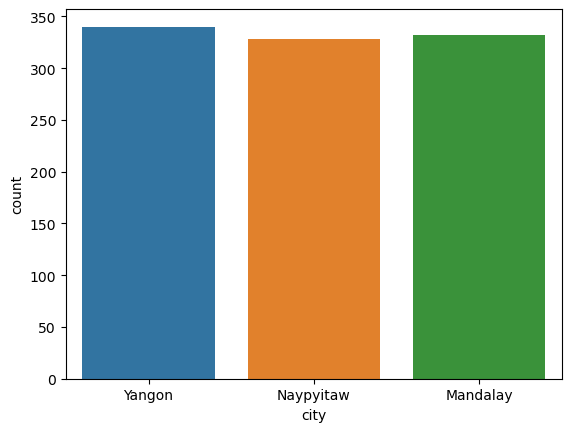

In [120]:
### Is there any difference in aggregate sales across branches?
sns.countplot(supermar['city'])
supermar['city'].value_counts()


There is not much difference in sales across the 3 branches of A, B and C. The sales in branch A is a bit higher than the rest of the branches.

/Users/jaimesastrecrespo/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



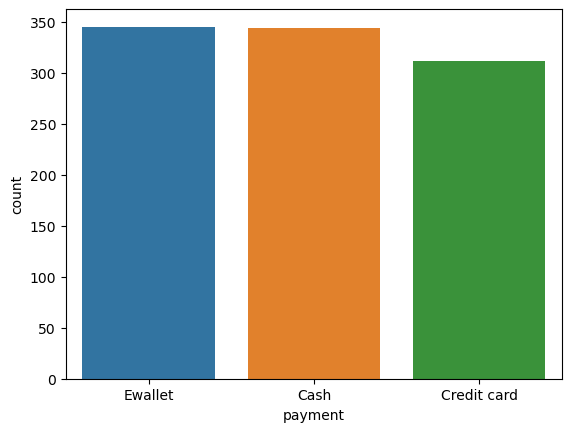

In [121]:
# most populer payment method

sns.countplot(supermar['payment']);

The most popular payment method is in-fact E-wallet and not credit cards.Cash payment is also popular.

/Users/jaimesastrecrespo/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



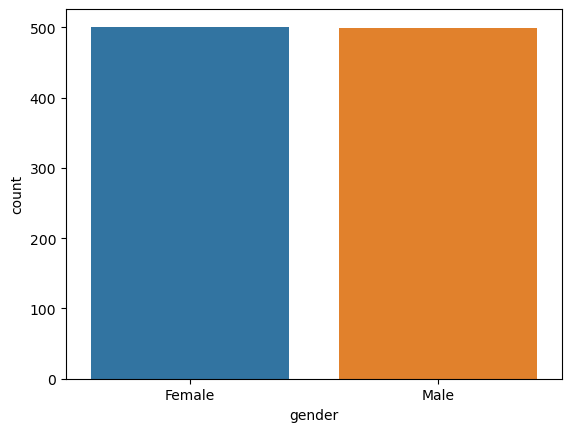

In [122]:
# most populer gender 

sns.countplot(supermar['gender']);

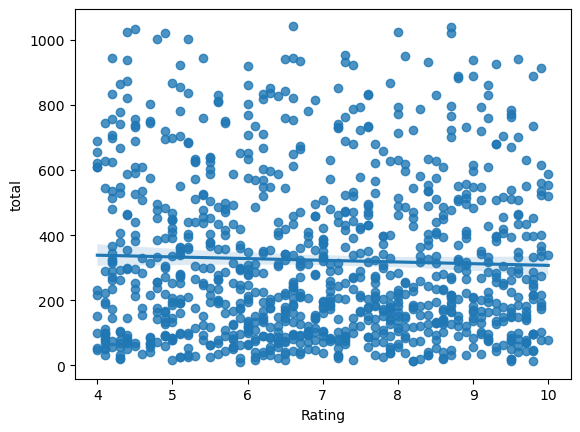

In [123]:
### Does Total affect the ratings that the customers provide?

sns.regplot(x="Rating",
            y="total", 
            data=supermar);

As you can see from the scatter plot and the trend line which is pretty flat that there is no relationship between Total spending per ticket and his rating.

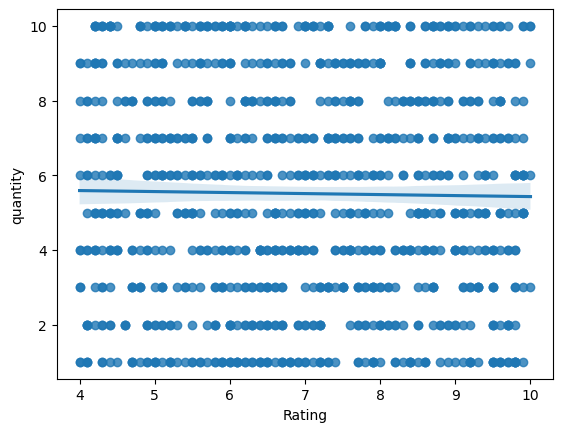

In [124]:
### Does quantity affect the ratings that the customers provide?

sns.regplot(x="Rating",
            y="quantity", 
            data=supermar);

As you can see from the scatter plot and the trend line which is pretty flat that there is no relationship between quantity of ticket and his rating.

<AxesSubplot:xlabel='city', ylabel='gross_income'>

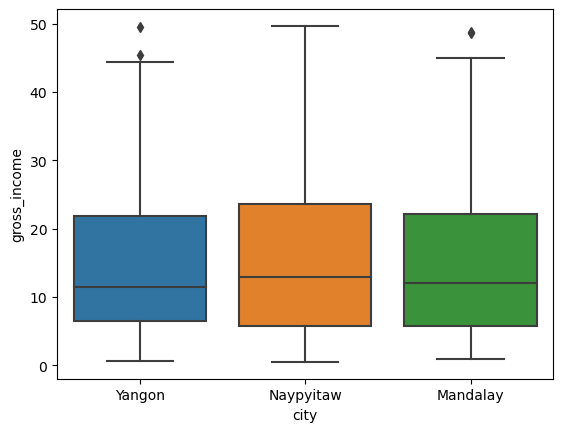

In [125]:
# Which city is the most profitable?

sns.boxplot(x=supermar['city'], y=supermar['gross_income'])

Naypyitaw is the most profitable branch in terms of gross income even if there are not a big difference between them.

<AxesSubplot:xlabel='gender', ylabel='gross_income'>

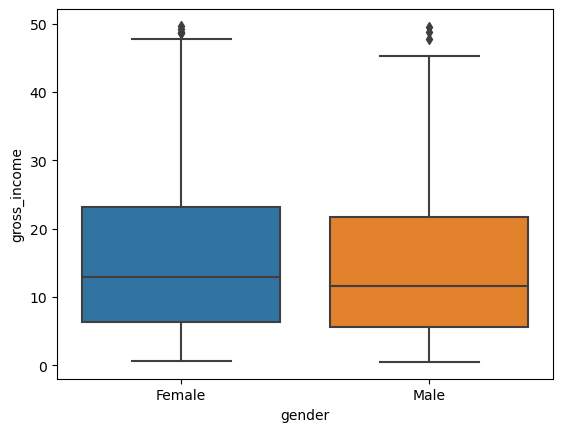

In [126]:
sns.boxplot(x=supermar['gender'], y=supermar['gross_income'])

Gross income is similar for both male and female, though female customers spend a bit higher at the 75th percentile.

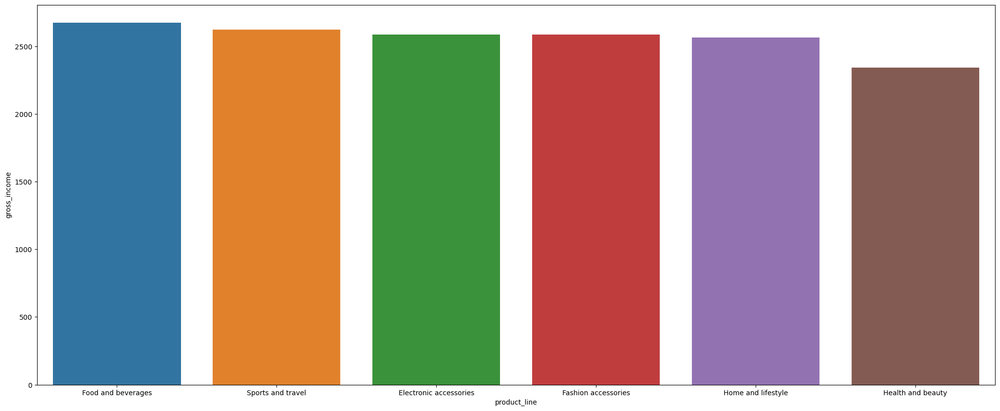

In [127]:
## Which product line generates most income?

cat=supermar[["product_line", "gross_income"]].groupby(['product_line'], as_index=False).sum().sort_values(by='gross_income', ascending=False)
plt.figure(figsize=(25,10))
sns.barplot(x='product_line', y='gross_income', data=cat);

Gross income is highest in food and beverages.

/Users/jaimesastrecrespo/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



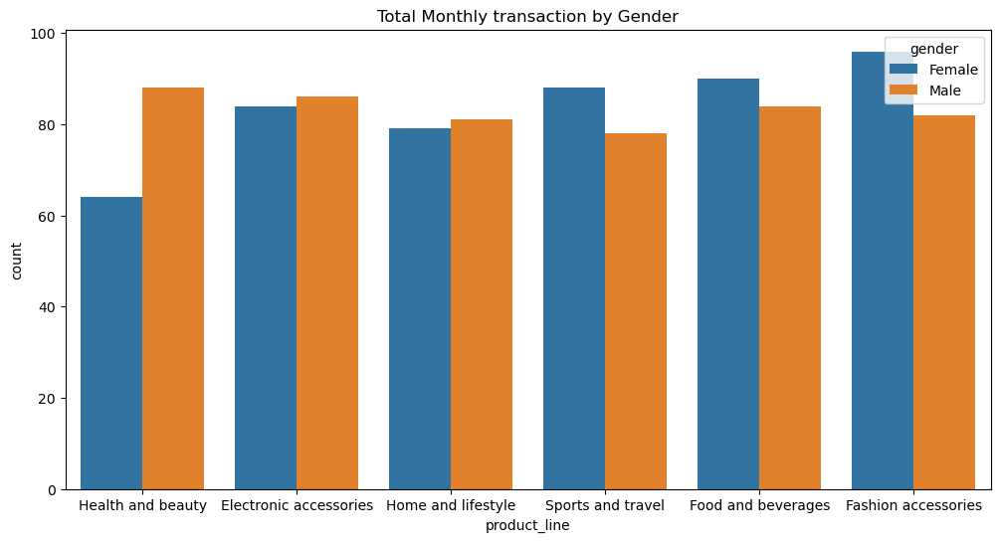

In [128]:
plt.figure(figsize=(12, 6))
plt.title('Total Monthly transaction by Gender')
sns.countplot(supermar['product_line'], hue = supermar.gender);

Females spend on 'fashion accessories' the most and for males it is 'Health and beauty'. Females also spend more on 'Sports and travel'.

/Users/jaimesastrecrespo/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



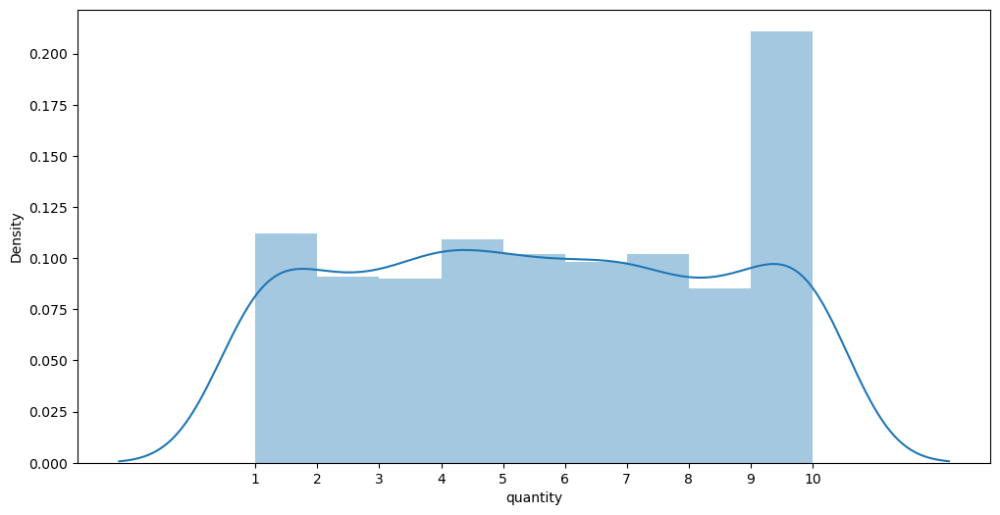

In [129]:
## How many products are bought by customers?

xdata = [1,2,3,4,5,6,7,8,9,10]
plt.figure(figsize = (12,6));
sns.distplot(supermar['quantity']);
plt.xticks(xdata);

Most of the customers buy 10 quantities.

/Users/jaimesastrecrespo/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:title={'center':'Daily Sales by Day of the Week'}, xlabel='day_name', ylabel='count'>

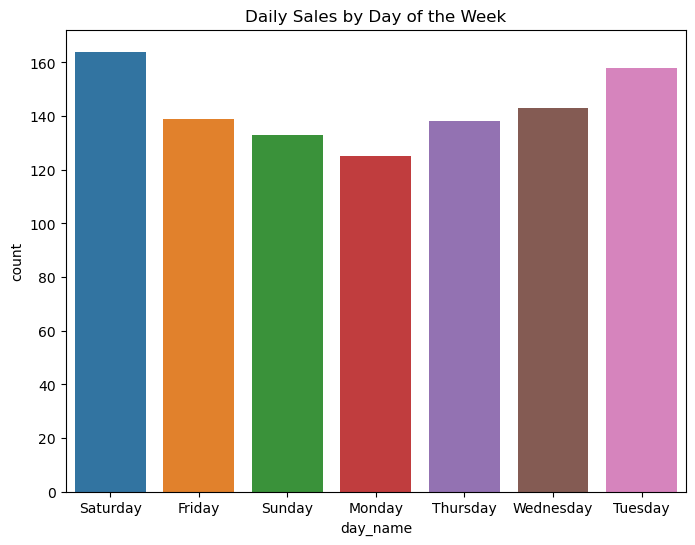

In [130]:
# Which day of the week has maximum sales?
plt.figure(figsize=(8, 6))
plt.title('Daily Sales by Day of the Week')
sns.countplot(supermar['day_name'])

In [131]:
 ## Which hour of the day is the busiest?



Text(0.5, 1.0, 'Product Sales per Hour')

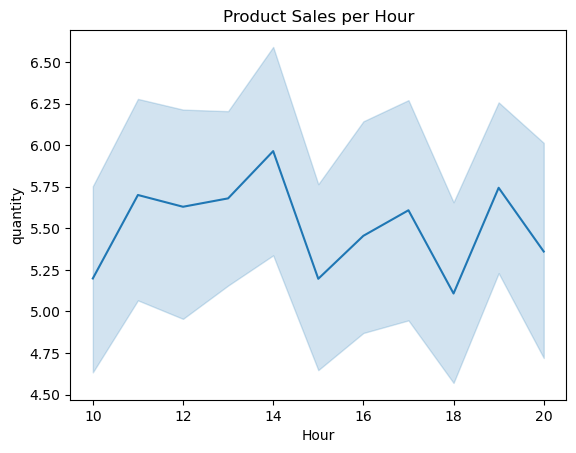

In [132]:
sns.lineplot(x="Hour",  y = 'quantity',data =supermar).set_title("Product Sales per Hour")

Peak is observed in the 14th hour i.e 2 pm of the day. Hence, sales is typically higher in the afternoons.

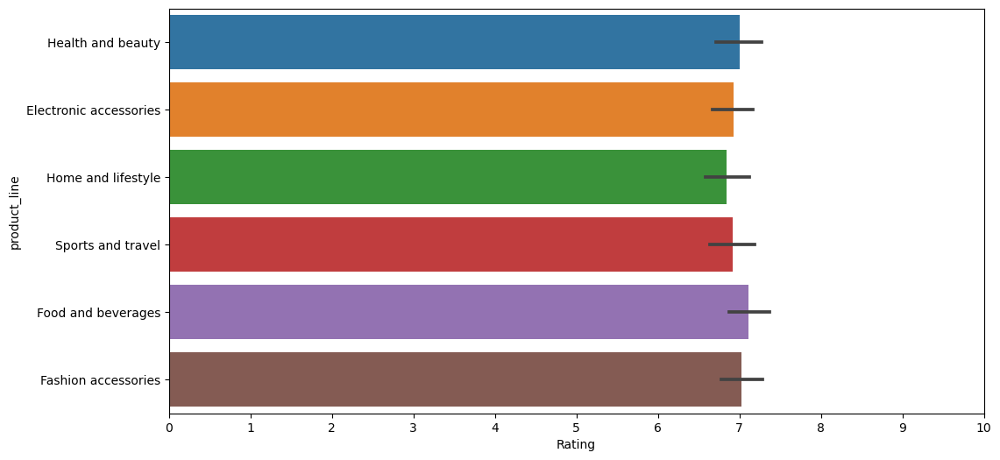

In [133]:
#Which product line should the supermarket focus on?
#### To answer this question, let us look at 2 graphs below:

xdata = [0,1,2,3,4,5,6,7,8,9,10]
plt.figure(figsize = (12,6))
sns.barplot(y = supermar['product_line'], x = supermar['Rating'])
plt.xticks(xdata);

<AxesSubplot:xlabel='quantity', ylabel='product_line'>

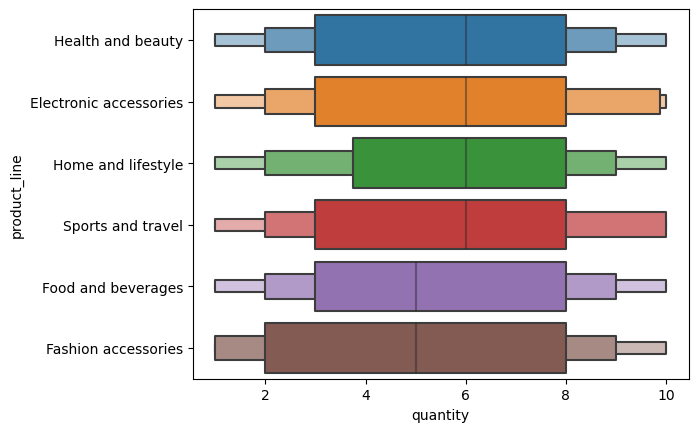

In [134]:
sns.boxenplot(y = 'product_line', x = 'quantity', data=supermar )

Though the rating for ‘fashion accessories’ and ‘food and beverages’ is high but quantity purchased is low. Hence, supply for these products need to be increased.

In [135]:

df2 = supermar.loc[supermar['day_name'].isin(['Tuesday'])]

In [136]:
df2

,invoice_id,branch,city,customer_type,gender,product_line,unit_price,quantity,tax5,total,time,payment,cogs,gross_income,Rating,Month_day,day_name,Hour,month
12,365-64-0515,A,Yangon,Normal,Female,Electronic accessories,46.95,5,11.7375,246.4875,2022-11-13 10:25:00,Ewallet,234.75,11.7375,7.1,2/12/2019,Tuesday,10,February
15,299-46-1805,B,Mandalay,Member,Female,Sports and travel,93.72,6,28.1160,590.4360,2022-11-13 16:19:00,Cash,562.32,28.1160,4.5,1/15/2019,Tuesday,16,January
17,765-26-6951,A,Yangon,Normal,Male,Sports and travel,72.61,6,21.7830,457.4430,2022-11-13 10:39:00,Credit card,435.66,21.7830,6.9,1/1/2019,Tuesday,10,January
21,371-85-5789,B,Mandalay,Normal,Male,Health and beauty,87.98,3,13.1970,277.1370,2022-11-13 10:40:00,Ewallet,263.94,13.1970,5.1,3/5/2019,Tuesday,10,March
37,272-65-1806,A,Yangon,Normal,Female,Electronic accessories,60.88,9,27.3960,575.3160,2022-11-13 17:17:00,Ewallet,547.92,27.3960,4.7,1/15/2019,Tuesday,17,January
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
961,324-92-3863,A,Yangon,Member,Male,Electronic accessories,20.89,2,2.0890,43.8690,2022-11-13 18:45:00,Cash,41.78,2.0890,9.8,2/5/2019,Tuesday,18,February
962,593-08-5916,A,Yangon,Normal,Female,Fashion accessories,15.50,1,0.7750,16.2750,2022-11-13 15:23:00,Credit card,15.50,0.7750,7.4,3/19/2019,Tuesday,15,March
970,746-04-1077,B,Mandalay,Member,Female,Food and beverages,84.63,10,42.3150,888.6150,2022-11-13 11:36:00,Credit card,846.30,42.3150,9.0,1/1/2019,Tuesday,11,January
977,518-71-6847,B,Mandalay,Member,Male,Food and beverages,26.60,6,7.9800,167.5800,2022-11-13 15:10:00,Ewallet,159.60,7.9800,4.9,2/26/2019,Tuesday,15,February


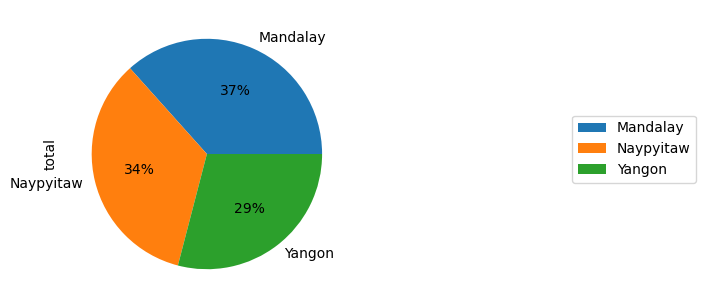

In [137]:
df2.groupby(['city']).sum().plot(kind='pie', y='total' , autopct='%1.0f%%')


plt.legend(bbox_to_anchor=(1,0.5), loc="center right", fontsize=10, 
           bbox_transform=plt.gcf().transFigure)
plt.subplots_adjust(left=0.0, bottom=0.1, right=0.45)

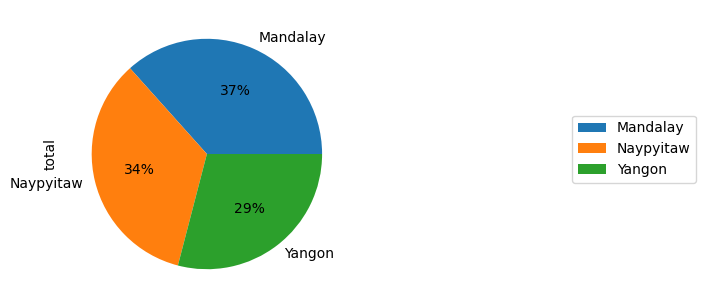

In [138]:

df2.groupby(['city']).sum().plot(kind='pie', y='total' , autopct='%1.0f%%')
plt.legend(bbox_to_anchor=(1,0.5), loc="center right", fontsize=10, 
           bbox_transform=plt.gcf().transFigure)
plt.subplots_adjust(left=0.0, bottom=0.1, right=0.45)


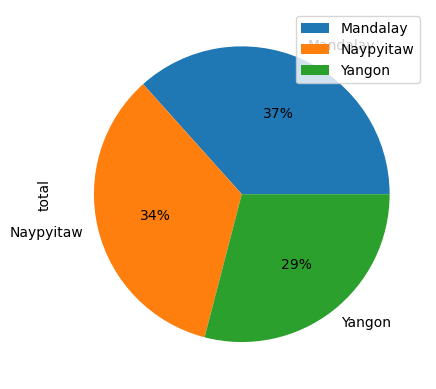

In [139]:
df3 = df2.groupby(['city']).sum().plot(kind='pie', y='total' , autopct='%1.0f%%')

In [140]:
supermar.to_csv(r'supermar_clean.csv')

In [141]:
super_file = gpd.read_file(r"./supermar_clean.csv")

In [142]:
geolocator = Nominatim(user_agent='your unique UA')
super_file['city_coord'] = super_file['city'].apply(geolocator.geocode).apply(lambda x: (x.latitude, x.longitude))
super_file

,field_1,invoice_id,branch,city,customer_type,gender,product_line,unit_price,quantity,tax5,...,payment,cogs,gross_income,Rating,Month_day,day_name,Hour,month,geometry,city_coord
0,0,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,...,Ewallet,522.83,26.1415,9.1,1/5/2019,Saturday,13,January,None,"(16.7967129, 96.1609916)"
1,1,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.82,...,Cash,76.4,3.82,9.6,3/8/2019,Friday,10,March,None,"(19.7540045, 96.1344976)"
2,2,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,...,Credit card,324.31,16.2155,7.4,3/3/2019,Sunday,13,March,None,"(16.7967129, 96.1609916)"
3,3,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.288,...,Ewallet,465.76,23.288,8.4,1/27/2019,Sunday,20,January,None,"(16.7967129, 96.1609916)"
4,4,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,...,Ewallet,604.17,30.2085,5.3,2/8/2019,Friday,10,February,None,"(16.7967129, 96.1609916)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,995,233-67-5758,C,Naypyitaw,Normal,Male,Health and beauty,40.35,1,2.0175,...,Ewallet,40.35,2.0175,6.2,1/29/2019,Tuesday,13,January,None,"(19.7540045, 96.1344976)"
996,996,303-96-2227,B,Mandalay,Normal,Female,Home and lifestyle,97.38,10,48.69,...,Ewallet,973.8,48.69,4.4,3/2/2019,Saturday,17,March,None,"(21.9812746, 96.082375)"
997,997,727-02-1313,A,Yangon,Member,Male,Food and beverages,31.84,1,1.592,...,Cash,31.84,1.592,7.7,2/9/2019,Saturday,13,February,None,"(16.7967129, 96.1609916)"
998,998,347-56-2442,A,Yangon,Normal,Male,Home and lifestyle,65.82,1,3.291,...,Cash,65.82,3.291,4.1,2/22/2019,Friday,15,February,None,"(16.7967129, 96.1609916)"


In [143]:
super_file['lat'] = super_file['city_coord'].apply(lambda x: x[0])
super_file['long'] = super_file['city_coord'].apply(lambda x: x[1])

In [144]:
super_file.head()

,field_1,invoice_id,branch,city,customer_type,gender,product_line,unit_price,quantity,tax5,...,gross_income,Rating,Month_day,day_name,Hour,month,geometry,city_coord,lat,long
0,0,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,...,26.1415,9.1,1/5/2019,Saturday,13,January,None,"(16.7967129, 96.1609916)",16.796713,96.160992
1,1,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.82,...,3.82,9.6,3/8/2019,Friday,10,March,None,"(19.7540045, 96.1344976)",19.754005,96.134498
2,2,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,...,16.2155,7.4,3/3/2019,Sunday,13,March,None,"(16.7967129, 96.1609916)",16.796713,96.160992
3,3,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.288,...,23.288,8.4,1/27/2019,Sunday,20,January,None,"(16.7967129, 96.1609916)",16.796713,96.160992
4,4,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,...,30.2085,5.3,2/8/2019,Friday,10,February,None,"(16.7967129, 96.1609916)",16.796713,96.160992


In [145]:
super_file.shape

(1000, 24)

In [146]:
super_file.rename(columns={'long':'lon'}, inplace=True)

In [147]:
del super_file['field_1']

In [148]:
super_file['month_numb'] = pd.to_datetime(super_file.month, format='%B').dt.month

super_file.head()

In [149]:
super_file.shape

(1000, 24)

In [150]:
super_file.to_csv(r'supermar_clean2.csv')

In [151]:
super_file.columns

Index(['invoice_id', 'branch', 'city', 'customer_type', 'gender',
       'product_line', 'unit_price', 'quantity', 'tax5', 'total', 'time',
       'payment', 'cogs', 'gross_income', 'Rating', 'Month_day', 'day_name',
       'Hour', 'month', 'geometry', 'city_coord', 'lat', 'lon', 'month_numb'],
      dtype='object')

In [152]:
import altair as alt
alt.Chart(df2).mark_point(filled=True).encode(
    alt.X('city'),
    alt.Y('total'),
    alt.Size('gender')
)

alt.Chart(...)

In [153]:
import plotly.express as px

fig = px.pie(df2, values='total', names='customer_type')
fig.show()

In [155]:
df2['total'].sum()

51482.245500000005